In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd

In [2]:
pd.set_option('display.max_rows', 500)

In [3]:
file_path = 'C:/Users/Jacob/Documents/datasets/mimic-iv-0.4/'
save_path = 'C:/Users/Jacob/Documents/datasets/mimic-iv-0.4-processed/'
if not os.path.exists(save_path):
    os.mkdir(save_path)

In [4]:
adm = pd.read_csv(os.path.join(save_path, "icu", "admissions.csv"))
# ***reading labevents is slow***
lab = pd.read_csv(os.path.join(file_path, "hosp", "labevents.csv"), usecols=["subject_id", "hadm_id", "itemid", "charttime", "valuenum", "valueuom", "ref_range_lower", "ref_range_upper"])
# N.B. - ignores "value", so only uses numeric lab values

In [5]:
# Restrict the dataset to the previously selected admission ids only.
lab = lab.loc[lab["hadm_id"].isin(adm["hadm_id"])]

# Require a value with a unit of measurement
print(lab["valueuom"].isna().sum())
lab = lab.drop(lab.loc[lab["valueuom"].isna()].index)
print(lab["valuenum"].isna().sum())
lab = lab.drop(lab.loc[lab["valuenum"].isna()].index)

print("Number of patients remaining in the database: ")
print(lab["subject_id"].nunique())
print("Number of datapoints remaining in the database: ")
print(len(lab))
lab.head()

552673
79881
Number of patients remaining in the database: 
10803
Number of datapoints remaining in the database: 
3502251


,subject_id,hadm_id,itemid,charttime,valuenum,valueuom,ref_range_lower,ref_range_upper
2543,12457441,21673651.0,50861,2135-08-16 23:45:00,25.0,IU/L,0.0,40.0
2544,12457441,21673651.0,50862,2135-08-16 23:45:00,3.4,g/dL,3.5,5.2
2545,12457441,21673651.0,50863,2135-08-16 23:45:00,103.0,IU/L,35.0,105.0
2546,12457441,21673651.0,50868,2135-08-16 23:45:00,13.0,mEq/L,8.0,20.0
2547,12457441,21673651.0,50878,2135-08-16 23:45:00,104.0,IU/L,0.0,40.0


In [6]:
# Merge itemid
item_id = pd.read_csv(os.path.join(file_path, "hosp", "d_labitems.csv"))
item_id = item_id[["itemid", "label"]]
lab = pd.merge(lab, item_id, on="itemid")

In [7]:
n_best = 100
#For each item, evaluate the number of patients who have been given this item.
pat_for_item = lab.groupby("label")["subject_id"].nunique()
# Order by occurence and take the 20 best (the ones with the most patients)
frequent_labels = pat_for_item.sort_values(ascending=False)[:n_best]

#Select only the time series with high occurence.
lab = lab.loc[lab["label"].isin(list(frequent_labels.index))]

print("Number of patients remaining in the database: ")
print(lab["subject_id"].nunique())

Number of patients remaining in the database: 
10803


### Units Cleaning

#### 1) In amounts

In [8]:
# Verification that all input labels have the same amounts units.
lab.groupby("label")["valueuom"].value_counts(dropna=False)

label                            valueuom
% Hemoglobin A1c                 %             2569
Absolute Basophil Count          K/uL          6158
Absolute Eosinophil Count        K/uL          6160
Absolute Lymphocyte Count        K/uL          6158
                                 #/uL            98
Absolute Monocyte Count          K/uL          6158
Absolute Neutrophil Count        K/uL          6162
Alanine Aminotransferase (ALT)   IU/L         28398
Albumin                          g/dL         14293
Alkaline Phosphatase             IU/L         27589
Alveolar-arterial Gradient       mm Hg         1893
Amylase                          IU/L          3270
Anion Gap                        mEq/L       115417
Asparate Aminotransferase (AST)  IU/L         28449
Atypical Lymphocytes             %             4150
Bands                            %             4370
Base Excess                      mEq/L        71936
Basophils                        %            13805
Bicarbonate           

In [9]:
# Correct the units
lab = lab.drop(lab.loc[(lab["label"] == "Absolute Lymphocyte Count") & (lab["valueuom"] != "K/uL")].index)
lab = lab.drop(lab.loc[(lab["label"] == "MCHC") & (lab["valueuom"] != "%")].index)

lab.groupby("label")["valueuom"].value_counts(dropna=False)

label                            valueuom
% Hemoglobin A1c                 %             2569
Absolute Basophil Count          K/uL          6158
Absolute Eosinophil Count        K/uL          6160
Absolute Lymphocyte Count        K/uL          6158
Absolute Monocyte Count          K/uL          6158
Absolute Neutrophil Count        K/uL          6162
Alanine Aminotransferase (ALT)   IU/L         28398
Albumin                          g/dL         14293
Alkaline Phosphatase             IU/L         27589
Alveolar-arterial Gradient       mm Hg         1893
Amylase                          IU/L          3270
Anion Gap                        mEq/L       115417
Asparate Aminotransferase (AST)  IU/L         28449
Atypical Lymphocytes             %             4150
Bands                            %             4370
Base Excess                      mEq/L        71936
Basophils                        %            13805
Bicarbonate                      mEq/L       115962
Bilirubin, Direct     

In [10]:
# #Only select the subset that was used in the paper (only missing is INR(PT))
# subset=["Albumin","Alanine Aminotransferase (ALT)","Alkaline Phosphatase","Anion Gap","Asparate Aminotransferase (AST)","Base Excess","Basophils","Bicarbonate","Bilirubin, Total","Calcium, Total","Calculated Total CO2","Chloride","Creatinine","Eosinophils","Glucose","Hematocrit","Hemoglobin",
# "Lactate","Lymphocytes","MCH","MCHC","MCV","Magnesium","Monocytes","Neutrophils","PT","PTT","Phosphate","Platelet Count","Potassium","RDW","Red Blood Cells","Sodium","Specific Gravity","Urea Nitrogen","White Blood Cells","pCO2","pH","pO2"]

# lab = lab.loc[lab["LABEL"].isin(subset)]


### Check for outliers

#### 1) In amounts

In [11]:
lab.groupby("label")["valuenum"].describe()

,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
% Hemoglobin A1c,2569.0,6.585481,2.058499,3.90,5.500,5.800,6.8000,22.00
Absolute Basophil Count,6158.0,0.038647,0.159524,0.00,0.000,0.020,0.0500,6.33
Absolute Eosinophil Count,6160.0,0.159091,0.281911,0.00,0.000,0.070,0.1900,5.02
Absolute Lymphocyte Count,6158.0,2.190870,10.355732,0.00,0.780,1.290,2.0175,259.02
Absolute Monocyte Count,6158.0,0.829500,0.982369,0.00,0.380,0.680,1.0500,28.12
Absolute Neutrophil Count,6162.0,10.317971,7.772298,0.00,5.500,8.870,13.1500,98.01
Alanine Aminotransferase (ALT),28398.0,271.480527,955.115744,0.00,22.000,42.000,103.0000,25460.00
Albumin,14293.0,3.099027,0.692640,0.40,2.600,3.100,3.6000,5.70
Alkaline Phosphatase,27589.0,126.960165,119.435522,7.00,65.000,92.000,144.0000,2113.00


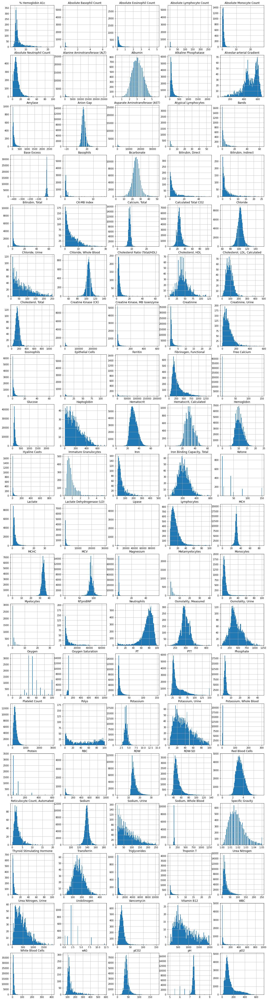

In [12]:
plt.figure(figsize=(20, 80))
for i, label in enumerate(sorted(lab["label"].unique())):
    plt.subplot(20, 5, 1+i)
    lab["valuenum"][lab["label"] == label].hist(bins=100)
    plt.title(label)

In [13]:
# Clean outliers
from tqdm import tqdm_notebook

for label in tqdm_notebook(sorted(lab["label"].unique())):
    lab = lab.drop(lab.loc[(lab["label"] == label) & ((lab["valuenum"] < lab["ref_range_lower"]) | (lab["ref_range_upper"] < lab["valuenum"]))].index)

In [14]:
print("Number of patients remaining in the database: ")
print(lab["subject_id"].nunique())
print("Number of datapoints remaining in the database: ")
print(len(lab))

Number of patients remaining in the database: 
10803
Number of datapoints remaining in the database: 
2010641


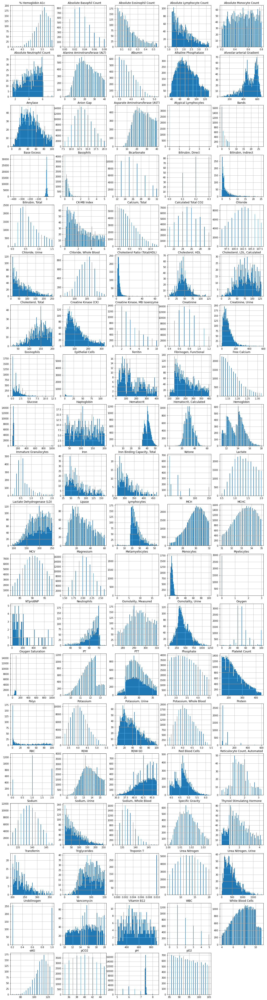

In [15]:
plt.figure(figsize=(20, 80))
for i, label in enumerate(sorted(lab["label"].unique())):
    plt.subplot(20, 5, 1+i)
    lab["valuenum"][lab["label"] == label].hist(bins=100)
    plt.title(label)

In [17]:
lab.to_csv(os.path.join(save_path, "hosp", "labevents.csv"))

## GaussRank rescaling

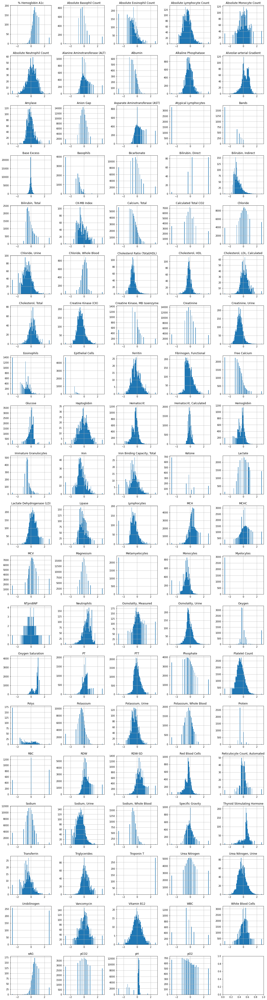

In [21]:
from gauss_rank_scaler import GaussRankScaler

fig, axes = plt.subplots(20, 5, figsize=(20, 80))
axes = [ax for sub_ax in axes for ax in sub_ax]
for i, label in enumerate(sorted(lab["label"].unique())):
    scaler = GaussRankScaler()
    series = lab["valuenum"][lab["label"] == label]
    X_train_new = scaler.fit_transform(series[:, np.newaxis])
    pd.DataFrame(X_train_new, columns=[label]).hist(ax=axes[i], bins=100)